# Bodybuilding Exercise Classification (BEC) Project

Welcome to BEC project!

This is my final project for Artificial Intelligence course at University of Guilan, Iran.

## 1. Goal
In this project, we want to train a deep learning model for classifying bodybuilding exercise images into 3 classes.

## 2. Data
All data (about 630 original images) are collected from internet, and then data augmentation is done for increasing the dataset's size and diversity (20160 final images). All images are named after their corresponding data augmentation as you will see later in the notebook.

## 3. Training
I used transfer learning and worked with yolo11n-cls model from https://docs.ultralytics.com

## 4. Evaluation
* I calculate the metrics: precision, recall, f1_score, overall accuracy, macro-averaged precision, recall, f1-score and weighted-averaged precision, recall, f1-score for both validation dataset and test dataset in related sections.
* Also confusion matrix for both datasets are available at: `BEC project/validation-yolo11ncls` and `BEC project/test-yolo11ncls`



## Data Preprocessing

### Data Cleaning

Check for and remove any images that can't be opened or are corrupted.


In [ ]:
import os
from PIL import Image

def is_valid_image(filepath):
  try:
    img = Image.open(filepath)
    img.verify()
    return True
  except:
    return False

In [ ]:
# image_dir = '/content/drive/MyDrive/BEC project/train'
# for filename in os.listdir(image_dir):
#   filepath = os.path.join(image_dir, filename)
#   if not is_valid_image(filepath):
#     print(f'Removing corrupted image: {filename}')
#     os.remove(filepath)

Fortunately there weren't any corrupted image.

### Image Resizing

Resize images to a uniform size that our model can accept.

In [ ]:
from PIL import  Image
import os

IMG_SIZE = 224

def resize_images(image_dir, target_size=(IMG_SIZE, IMG_SIZE)):
  for filename in os.listdir(image_dir):
    filepath = os.path.join(image_dir, filename)
    if filename.lower().endswith(('.jpg')):
          with Image.open(filepath) as img:
            img_resized = img.resize(target_size)
            img_resized.save(filepath)
    else:
      print(f"Skipping non-image file or directory")

resize_images('/content/drive/MyDrive/BEC project/train')

Skipping non-image file or directory
Skipping non-image file or directory


In [ ]:
# Check for image sizes

from PIL import Image
import os

def check_image_sizes(image_dir, target_size=(224, 224)):
    all_same_size = True
    for filename in os.listdir(image_dir):
        filepath = os.path.join(image_dir, filename)
        if filename.lower().endswith(('.jpg')):
            with Image.open(filepath) as img:
                if img.size != target_size:
                    print(f"Image {filename} is of size {img.size} instead of {target_size}.")
                    all_same_size = False
    if all_same_size:
        print("All images are of size 224x224.")
    else:
        print("Not all images are of size 224x224.")

In [ ]:
check_image_sizes('/content/drive/MyDrive/BEC project/train')

All images are of size 224x224.


### Data Augmentation

Increasing the dataset's diversity using
* Horizontally flipping✅
* Rotating✅
* Shifting the image horizontally✅
* Shifting the image vertically✅
* Brightness adjustment✅

In [ ]:
# Check the number of original images
import os

len(os.listdir('/content/drive/MyDrive/BEC project/train'))

632

In [ ]:
# Check the number of labels
import pandas as pd

df = pd.read_csv('/content/drive/MyDrive/BEC project/labels.csv')
len(df)

630

In [ ]:
# labels.csv dataframe columns:
import pandas as pd

df = pd.read_csv('/content/drive/MyDrive/BEC project/labels.csv')
df.columns

Index(['filename', 'label'], dtype='object')

#### Horizontally Flipping

❗❗❗PLEASE DO NOT RUN THIS CELLS! It must run one time and only one time during the project(I made it as comments so someone can't accidentally re-run this)❗❗❗



The following function:
* Takes `image_dir`, `save_dir`, `csv_path` as inputs.
* Reads images one by one from `image_dir`.
* Does a horizontal flip on them
* Saves them at the `save_dir`.
* Adds a row to the `labels.csv` file for each new generated image.

In [ ]:
# import albumentations as A
# import cv2
# import os
# import pandas as pd
# import matplotlib.pyplot as plt

# def horizontal_flip_save(image_dir, save_dir, csv_path):
#     # Define the augmentation (horizontal flip)
#     transform = A.HorizontalFlip(p=1.0)  # p=1.0 ensures the flip happens 100% of the time

#     # Load the CSV file
#     df = pd.read_csv(csv_path)

#     # Ensure the save directory exists
#     if not os.path.exists(save_dir):
#         os.makedirs(save_dir)

#     new_rows = []  # List to store new rows

#     for index, row in df.iterrows():
#         image_name = row['filename']
#         label = row['label']

#         # Read the image
#         image_path = os.path.join(image_dir, image_name)
#         image = cv2.imread(image_path)

#         # Apply the transformation
#         augmented = transform(image=image)
#         augmented_image = augmented['image']

#         # Create the new image name
#         name, ext = os.path.splitext(image_name)
#         new_name = f"{name}hf{ext}"

#         # Check if the new image already exists in the dataset
#         if new_name not in df['filename'].values:
#             # Save the augmented image
#             new_image_path = os.path.join(save_dir, new_name)
#             cv2.imwrite(new_image_path, augmented_image)

#             # Add a new row to the list if it does not exist
#             new_rows.append({'filename': new_name, 'label': label})

#     # If there are new rows, add them to the DataFrame and save the updated CSV file
#     if new_rows:
#         new_df = pd.DataFrame(new_rows)
#         df = pd.concat([df, new_df], ignore_index=True)

#         # Save the updated CSV file
#         df.to_csv(csv_path, index=False)

#         print(f"Horizontal flipping is done! {len(new_rows)} new images added.")
#     else:
#         print("No new images to add (they were already in the dataset).")

In [ ]:
# image_dir= '/content/drive/MyDrive/BEC project/train'
# save_dir = '/content/drive/MyDrive/BEC project/train/horizontally-flipped'
# csv_path = '/content/drive/MyDrive/BEC project/labels.csv'

# horizontal_flip_save(image_dir, save_dir, csv_path)

Horizontal flipping is done! 630 new images added.


In [ ]:
# # Check the number of new images
# len(os.listdir('/content/drive/MyDrive/BEC project/train/horizontally-flipped'))

630

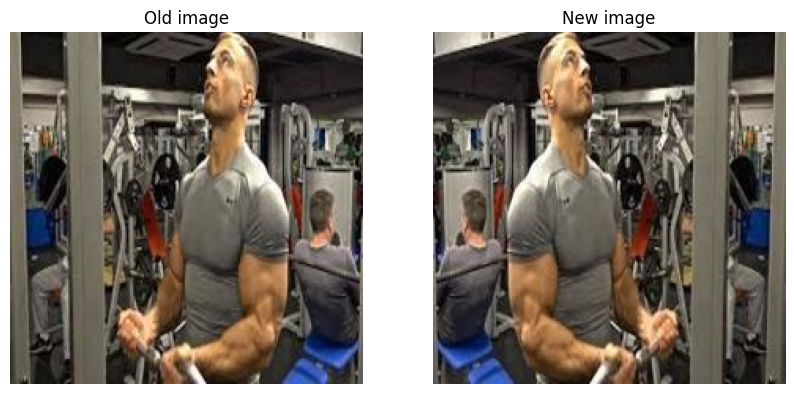

In [ ]:
# Compare the old version of an image with the new version of it
import matplotlib.pyplot as plt
import cv2

# Load the images using OpenCV
image1 = cv2.imread('/content/drive/MyDrive/BEC project/train/f100.jpg')
image2 = cv2.imread('/content/drive/MyDrive/BEC project/train/f100hf.jpg')

# Convert the images from BGR to RGB format (as OpenCV loads images in BGR format)
image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Create a figure
plt.figure(figsize=(10, 5))  # Adjust the figure size

# Display the first image
plt.subplot(1, 2, 1)  # (1 row, 2 columns, 1st plot)
plt.imshow(image1)
plt.axis('off')  # Hide axes
plt.title('Old image')  # Title for the first image

# Display the second image
plt.subplot(1, 2, 2)  # (1 row, 2 columns, 2nd plot)
plt.imshow(image2)
plt.axis('off')  # Hide axes
plt.title('New image')  # Title for the second image

# Show the plot
plt.show()


##### Function for moving new-generated images to the same directory in which original images are located


In [ ]:
import os
import shutil

def move_files(source_dir, destination_dir):
    # Check if source directory exists
    if not os.path.exists(source_dir):
        print(f"Source directory {source_dir} does not exist.")
        return

    # Check if destination directory exists, if not, create it
    if not os.path.exists(destination_dir):
        os.makedirs(destination_dir)

    # List all files in the source directory
    files = os.listdir(source_dir)

    # Move each file to the destination directory
    for file in files:
        full_file_name = os.path.join(source_dir, file)
        if os.path.isfile(full_file_name):
            shutil.move(full_file_name, destination_dir)

    # Print confirmation message
    print(f"Moved all files from {source_dir} to {destination_dir}")


In [ ]:
# source_directory = '/content/drive/MyDrive/BEC project/train/horizontally-flipped'
# destination_directory = '/content/drive/MyDrive/BEC project/train'

# move_files(source_directory, destination_directory)

Moved all files from /content/drive/MyDrive/BEC project/train/horizontally-flipped to /content/drive/MyDrive/BEC project/train


In [ ]:
# print(len(os.listdir('/content/drive/MyDrive/BEC project/train')))
# print(len(os.listdir('/content/drive/MyDrive/BEC project/train/horizontally-flipped')))

1262
0


#### Rotating

❗❗❗PLEASE DO NOT RUN THIS CELLS! It must run one time and only one time during the project(I made it as comments so someone can't accidentally re-run this)❗❗❗

The following function:
* Takes `image_dir`, `save_dir`, `csv_path` as inputs.
* Reads images one by one from `image_dir`.
* Does rotation on them
* Saves them at the `save_dir`.
* Adds a row to the `labels.csv` file for each new generated image.



In [ ]:
# import albumentations as A
# import cv2
# import os
# import pandas as pd
# import matplotlib.pyplot as plt

# def rotate_save(image_dir, save_dir, csv_path):
#     # Define the augmentation
#     transform = A.Rotate(limit=(-90, 90), p=1.0)

#     # Load the CSV file
#     df = pd.read_csv(csv_path)

#     # Ensure the save directory exists
#     if not os.path.exists(save_dir):
#         os.makedirs(save_dir)

#     new_rows = []  # List to store new rows

#     for index, row in df.iterrows():
#         image_name = row['filename']
#         label = row['label']

#         # Read the image
#         image_path = os.path.join(image_dir, image_name)
#         image = cv2.imread(image_path)

#         # Check if image was loaded successfully
#         if image is None:
#             continue  # Skip to the next image

#         # Apply the transformation
#         augmented = transform(image=image)
#         augmented_image = augmented['image']

#         # Create the new image name
#         name, ext = os.path.splitext(image_name)
#         new_name = f"{name}r{ext}"  # r stands for rotated

#         # Check if the new image already exists in the dataset
#         if new_name not in df['filename'].values:
#             # Save the augmented image
#             new_image_path = os.path.join(save_dir, new_name)
#             cv2.imwrite(new_image_path, augmented_image)

#             # Add a new row to the list if it does not exist
#             new_rows.append({'filename': new_name, 'label': label})

#     # If there are new rows, add them to the DataFrame and save the updated CSV file
#     if new_rows:
#         new_df = pd.DataFrame(new_rows)
#         df = pd.concat([df, new_df], ignore_index=True)

#         # Save the updated CSV file
#         df.to_csv(csv_path, index=False)

#         print(f"Rotation is done! {len(new_rows)} new images added.")
#     else:
#         print("No new images to add (they were already in the dataset).")


In [ ]:
# image_dir= '/content/drive/MyDrive/BEC project/train'
# save_dir = '/content/drive/MyDrive/BEC project/train/rotated'
# csv_path = '/content/drive/MyDrive/BEC project/labels.csv'

# rotate_save(image_dir, save_dir, csv_path)

Rotation is done! 1260 new images added.


In [ ]:
# Check the number of new images
import os

len(os.listdir('/content/drive/MyDrive/BEC project/train/rotated'))

1260

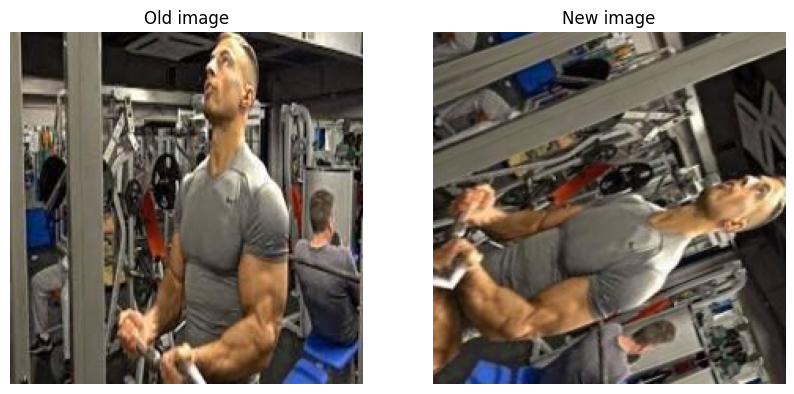

In [ ]:
# Compare the old version of an image with the new version of it
import matplotlib.pyplot as plt
import cv2

# Load the images using OpenCV
image1 = cv2.imread('/content/drive/MyDrive/BEC project/train/f100.jpg')
image2 = cv2.imread('/content/drive/MyDrive/BEC project/train/rotated/f100r.jpg')

# Convert the images from BGR to RGB format (as OpenCV loads images in BGR format)
image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Create a figure
plt.figure(figsize=(10, 5))  # Adjust the figure size

# Display the first image
plt.subplot(1, 2, 1)  # (1 row, 2 columns, 1st plot)
plt.imshow(image1)
plt.axis('off')  # Hide axes
plt.title('Old image')  # Title for the first image

# Display the second image
plt.subplot(1, 2, 2)  # (1 row, 2 columns, 2nd plot)
plt.imshow(image2)
plt.axis('off')  # Hide axes
plt.title('New image')  # Title for the second image

# Show the plot
plt.show()


In [ ]:
# Moving new images to train folder
# source_directory = '/content/drive/MyDrive/BEC project/train/rotated'
# destination_directory = '/content/drive/MyDrive/BEC project/train'

# move_files(source_directory, destination_directory)

Moved all files from /content/drive/MyDrive/BEC project/train/rotated to /content/drive/MyDrive/BEC project/train


#### Shifting the image horizontally

❗❗❗PLEASE DO NOT RUN THIS CELLS! It must run one time and only one time during the project(I made it as comments so someone can't accidentally re-run this)❗❗❗

The following function:
* Takes `image_dir`, `save_dir`, `csv_path` as inputs.
* Reads images one by one from `image_dir`.
* Does horizontall shift on them by ... pixels
* Saves them at the `save_dir`.
* Adds a row to the `labels.csv` file for each new generated image.

In [ ]:
# import albumentations as A
# import cv2
# import os
# import pandas as pd

# def horizontal_shift_save(image_dir, save_dir, csv_path):
#     # Define the augmentation (horizontal shift with nearest-neighbor padding)
#     transform = A.ShiftScaleRotate(shift_limit_x=0.1, shift_limit_y=0.0, scale_limit=0.0, rotate_limit=0, border_mode=cv2.BORDER_REPLICATE, p=1.0)

#     # Load the CSV file
#     df = pd.read_csv(csv_path)

#     # Ensure the save directory exists
#     if not os.path.exists(save_dir):
#         os.makedirs(save_dir)

#     new_rows = []  # List to store new rows

#     for index, row in df.iterrows():
#         image_name = row['filename']
#         label = row['label']

#         # Read the image
#         image_path = os.path.join(image_dir, image_name)
#         image = cv2.imread(image_path)

#         # Check if image was loaded successfully
#         if image is None:
#             continue  # Skip to the next image


#         # Apply the transformation
#         augmented = transform(image=image)
#         augmented_image = augmented['image']

#         # Create the new image name
#         name, ext = os.path.splitext(image_name)
#         new_name = f"{name}hs{ext}"  # hs stands for horizontally shifted

#         # Check if the new image already exists in the dataset
#         if new_name not in df['filename'].values:
#             # Save the augmented image
#             new_image_path = os.path.join(save_dir, new_name)
#             cv2.imwrite(new_image_path, augmented_image)

#             # Add a new row to the list if it does not exist
#             new_rows.append({'filename': new_name, 'label': label})

#     # If there are new rows, add them to the DataFrame and save the updated CSV file
#     if new_rows:
#         new_df = pd.DataFrame(new_rows)
#         df = pd.concat([df, new_df], ignore_index=True)

#         # Save the updated CSV file
#         df.to_csv(csv_path, index=False)

#         print(f"Horizontal shifting with nearest-neighbor padding is done! {len(new_rows)} new images added.")
#     else:
#         print("No new images to add (they were already in the dataset).")



In [ ]:
# image_dir= '/content/drive/MyDrive/BEC project/train'
# save_dir = '/content/drive/MyDrive/BEC project/train/horizontal-shifted'
# csv_path = '/content/drive/MyDrive/BEC project/labels.csv'

# horizontal_shift_save(image_dir, save_dir, csv_path)

Horizontal shifting with nearest-neighbor padding is done! 2520 new images added.


In [ ]:
# Check the number of total images
import os

len(os.listdir('/content/drive/MyDrive/BEC project/train/horizontal-shifted'))

2520

In [ ]:
# Check the number of dataframe samples
import pandas as pd

df = pd.read_csv('/content/drive/MyDrive/BEC project/labels.csv')

len(df)

5040

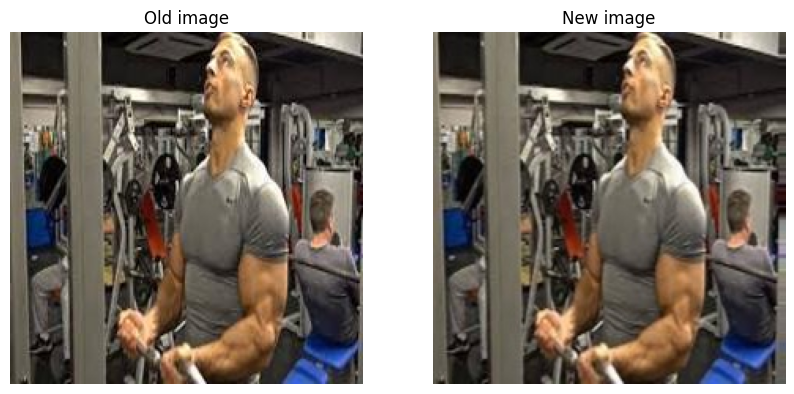

In [ ]:
# Compare the old version of an image with the new version of it
import matplotlib.pyplot as plt
import cv2

# Load the images using OpenCV
image1 = cv2.imread('/content/drive/MyDrive/BEC project/train/f100.jpg')
image2 = cv2.imread('/content/drive/MyDrive/BEC project/train/horizontal-shifted/f100hs.jpg')

# Convert the images from BGR to RGB format (as OpenCV loads images in BGR format)
image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Create a figure
plt.figure(figsize=(10, 5))  # Adjust the figure size

# Display the first image
plt.subplot(1, 2, 1)  # (1 row, 2 columns, 1st plot)
plt.imshow(image1)
plt.axis('off')  # Hide axes
plt.title('Old image')  # Title for the first image

# Display the second image
plt.subplot(1, 2, 2)  # (1 row, 2 columns, 2nd plot)
plt.imshow(image2)
plt.axis('off')  # Hide axes
plt.title('New image')  # Title for the second image

# Show the plot
plt.show()

In [ ]:
# # Move horizontally shifted images to train folder
# source_dir = '/content/drive/MyDrive/BEC project/train/horizontal-shifted'
# destination_dir = '/content/drive/MyDrive/BEC project/train'

# move_files(source_dir,destination_dir)

# # Check
# print(len(os.listdir(source_dir)))
# print(len(os.listdir(destination_dir)))

Moved all files from /content/drive/MyDrive/BEC project/train/horizontal-shifted to /content/drive/MyDrive/BEC project/train
0
5042


#### Shifting the image vertically


❗❗❗PLEASE DO NOT RUN THIS CELLS! It must run one time and only one time during the project(I made it as comments so someone can't accidentally re-run this)❗❗❗

The following function:
* Takes `image_dir`, `save_dir`, `csv_path` as inputs.
* Reads images one by one from `image_dir`.
* Does vertical shift on them by ... pixels
* Saves them at the `save_dir`.
* Adds a row to the `labels.csv` file for each new generated image.

In [ ]:
# import albumentations as A
# import cv2
# import os
# import pandas as pd

# def vertical_shift_save(image_dir, save_dir, csv_path):
#     # Define the augmentation (vertical shift with nearest-neighbor padding)
#     transform = A.ShiftScaleRotate(shift_limit_x=0.0, shift_limit_y=0.2, scale_limit=0.0, rotate_limit=0, border_mode=cv2.BORDER_REPLICATE, p=1.0)

#     # Load the CSV file
#     df = pd.read_csv(csv_path)

#     # Ensure the save directory exists
#     if not os.path.exists(save_dir):
#         os.makedirs(save_dir)

#     new_rows = []  # List to store new rows

#     for index, row in df.iterrows():
#         image_name = row['filename']
#         label = row['label']

#         # Read the image
#         image_path = os.path.join(image_dir, image_name)
#         image = cv2.imread(image_path)

#         # Check if image was loaded successfully
#         if image is None:
#             continue  # Skip to the next image


#         # Apply the transformation
#         augmented = transform(image=image)
#         augmented_image = augmented['image']

#         # Create the new image name
#         name, ext = os.path.splitext(image_name)
#         new_name = f"{name}vs{ext}"  # vs stands for vertically shifted

#         # Check if the new image already exists in the dataset
#         if new_name not in df['filename'].values:
#             # Save the augmented image
#             new_image_path = os.path.join(save_dir, new_name)
#             cv2.imwrite(new_image_path, augmented_image)

#             # Add a new row to the list if it does not exist
#             new_rows.append({'filename': new_name, 'label': label})

#     # If there are new rows, add them to the DataFrame and save the updated CSV file
#     if new_rows:
#         new_df = pd.DataFrame(new_rows)
#         df = pd.concat([df, new_df], ignore_index=True)

#         # Save the updated CSV file
#         df.to_csv(csv_path, index=False)

#         print(f"Vertical shifting with nearest-neighbor padding is done! {len(new_rows)} new images added.")
#     else:
#         print("No new images to add (they were already in the dataset).")


In [ ]:
# image_dir= '/content/drive/MyDrive/BEC project/train'
# save_dir = '/content/drive/MyDrive/BEC project/train/vertical-shifted'
# csv_path = '/content/drive/MyDrive/BEC project/labels.csv'

# vertical_shift_save(image_dir, save_dir, csv_path)

Vertical shifting with nearest-neighbor padding is done! 5040 new images added.


In [ ]:
# Check the number of total images
import os

len(os.listdir('/content/drive/MyDrive/BEC project/train/vertical-shifted')) + len(os.listdir('/content/drive/MyDrive/BEC project/train'))-3

10080

In [ ]:
# Check the number of dataframe samples
import pandas as pd

df = pd.read_csv('/content/drive/MyDrive/BEC project/labels.csv')

len(df)

10080

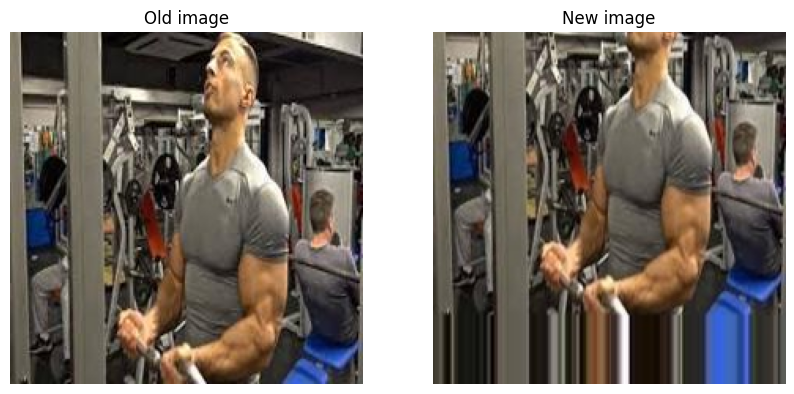

In [ ]:
# Compare the old version of an image with the new version of it
import matplotlib.pyplot as plt
import cv2

# Load the images using OpenCV
image1 = cv2.imread('/content/drive/MyDrive/BEC project/train/f100.jpg')
image2 = cv2.imread('/content/drive/MyDrive/BEC project/train/vertical-shifted/f100vs.jpg')

# Convert the images from BGR to RGB format (as OpenCV loads images in BGR format)
image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Create a figure
plt.figure(figsize=(10, 5))  # Adjust the figure size

# Display the first image
plt.subplot(1, 2, 1)  # (1 row, 2 columns, 1st plot)
plt.imshow(image1)
plt.axis('off')  # Hide axes
plt.title('Old image')  # Title for the first image

# Display the second image
plt.subplot(1, 2, 2)  # (1 row, 2 columns, 2nd plot)
plt.imshow(image2)
plt.axis('off')  # Hide axes
plt.title('New image')  # Title for the second image

# Show the plot
plt.show()

In [ ]:
# # Move vertically shifted images to train folder
# source_dir = '/content/drive/MyDrive/BEC project/train/vertical-shifted'
# destination_dir = '/content/drive/MyDrive/BEC project/train'

# move_files(source_dir,destination_dir)

# # Check
# print(len(os.listdir(source_dir)))
# print(len(os.listdir(destination_dir)))

Moved all files from /content/drive/MyDrive/BEC project/train/vertical-shifted to /content/drive/MyDrive/BEC project/train
0
10083


#### Brightness adjustment


❗❗❗PLEASE DO NOT RUN THIS CELLS! It must run one time and only one time during the project(I made it as comments so someone can't accidentally re-run this)❗❗❗

The following function:
* Takes `image_dir`, `save_dir`, `csv_path` as inputs.
* Reads images one by one from `image_dir`.
* Adjusts brightness and contrast of them
* Saves them at the `save_dir`.
* Adds a row to the `labels.csv` file for each new generated image.


In [ ]:
# import albumentations as A
# import cv2
# import os
# import pandas as pd

# def brightness_contrast_adjustment_save(image_dir, save_dir, csv_path):
#     # Define the augmentation (brightness and contrast adjustment)
#     transform = A.RandomBrightnessContrast(brightness_limit=0.4, contrast_limit=0.4, p=1.0)

#     # Load the CSV file
#     df = pd.read_csv(csv_path)

#     # Ensure the save directory exists
#     if not os.path.exists(save_dir):
#         os.makedirs(save_dir)

#     new_rows = []  # List to store new rows

#     for index, row in df.iterrows():
#         image_name = row['filename']
#         label = row['label']

#         # Read the image
#         image_path = os.path.join(image_dir, image_name)
#         image = cv2.imread(image_path)

#         # Check if image was loaded successfully
#         if image is None:
#             continue  # Skip to the next image

#         # Apply the transformation (brightness and contrast adjustment)
#         augmented = transform(image=image)
#         augmented_image = augmented['image']

#         # Create the new image name
#         name, ext = os.path.splitext(image_name)
#         new_name = f"{name}bc{ext}"  # ba stands for brightness and contrast adjustment

#         # Check if the new image already exists in the dataset
#         if new_name not in df['filename'].values:
#             # Save the augmented image
#             new_image_path = os.path.join(save_dir, new_name)
#             cv2.imwrite(new_image_path, augmented_image)

#             # Add a new row to the list if it does not exist
#             new_rows.append({'filename': new_name, 'label': label})

#     # If there are new rows, add them to the DataFrame and save the updated CSV file
#     if new_rows:
#         new_df = pd.DataFrame(new_rows)
#         df = pd.concat([df, new_df], ignore_index=True)

#         # Save the updated CSV file
#         df.to_csv(csv_path, index=False)

#         print(f"Brightness and contrast adjustment is done! {len(new_rows)} new images added.")
#     else:
#         print("No new images to add (they were already in the dataset).")


In [ ]:
# image_dir= '/content/drive/MyDrive/BEC project/train'
# save_dir = '/content/drive/MyDrive/BEC project/train/brightness-contrast'
# csv_path = '/content/drive/MyDrive/BEC project/labels.csv'

# brightness_contrast_adjustment_save(image_dir, save_dir, csv_path)

Brightness and contrast adjustment is done! 10080 new images added.


In [ ]:
# Check the number of total images
import os

len(os.listdir('/content/drive/MyDrive/BEC project/train/brightness-contrast')) + len(os.listdir('/content/drive/MyDrive/BEC project/train'))-2

20160

In [ ]:
# Check the number of dataframe samples
import pandas as pd

df = pd.read_csv('/content/drive/MyDrive/BEC project/labels.csv')

len(df)

20160

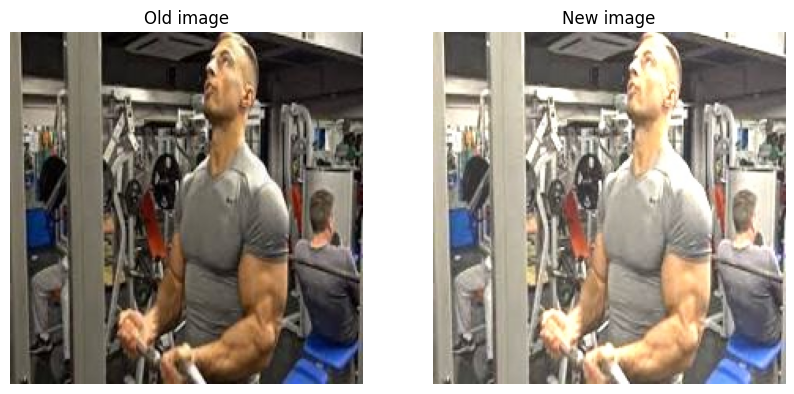

In [ ]:
# Compare the old version of an image with the new version of it
import matplotlib.pyplot as plt
import cv2

# Load the images using OpenCV
image1 = cv2.imread('/content/drive/MyDrive/BEC project/train/f100.jpg')
image2 = cv2.imread('/content/drive/MyDrive/BEC project/train/brightness-contrast/f100bc.jpg')

# Convert the images from BGR to RGB format (as OpenCV loads images in BGR format)
image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Create a figure
plt.figure(figsize=(10, 5))  # Adjust the figure size

# Display the first image
plt.subplot(1, 2, 1)  # (1 row, 2 columns, 1st plot)
plt.imshow(image1)
plt.axis('off')  # Hide axes
plt.title('Old image')  # Title for the first image

# Display the second image
plt.subplot(1, 2, 2)  # (1 row, 2 columns, 2nd plot)
plt.imshow(image2)
plt.axis('off')  # Hide axes
plt.title('New image')  # Title for the second image

# Show the plot
plt.show()

In [ ]:
# # Move new images to train folder
# source_dir = '/content/drive/MyDrive/BEC project/train/brightness-contrast'
# destination_dir = '/content/drive/MyDrive/BEC project/train'

# move_files(source_dir,destination_dir)

# # Check
# print(len(os.listdir(source_dir)))
# print(len(os.listdir(destination_dir)))

Moved all files from /content/drive/MyDrive/BEC project/train/brightness-contrast to /content/drive/MyDrive/BEC project/train
0
20162


#### Visualizing and comparing the augmented and original images

In [ ]:
# Compare the old version of an image with the new version of it
import matplotlib.pyplot as plt
import cv2

def compare_images(id):

  # Load the images using OpenCV
  original = cv2.imread(f'/content/drive/MyDrive/BEC project/train/{id}.jpg')
  rotated = cv2.imread(f'/content/drive/MyDrive/BEC project/train/{id}r.jpg')
  hf = cv2.imread(f'/content/drive/MyDrive/BEC project/train/{id}hf.jpg')
  hs = cv2.imread(f'/content/drive/MyDrive/BEC project/train/{id}hs.jpg')
  hfr = cv2.imread(f'/content/drive/MyDrive/BEC project/train/{id}hfr.jpg')
  hfhs = cv2.imread(f'/content/drive/MyDrive/BEC project/train/{id}hfhs.jpg')
  hfrhs = cv2.imread(f'/content/drive/MyDrive/BEC project/train/{id}hfrhs.jpg')
  rhs = cv2.imread(f'/content/drive/MyDrive/BEC project/train/{id}rhs.jpg')
  vs = cv2.imread(f'/content/drive/MyDrive/BEC project/train/{id}vs.jpg')
  rvs = cv2.imread(f'/content/drive/MyDrive/BEC project/train/{id}rvs.jpg')
  hfvs = cv2.imread(f'/content/drive/MyDrive/BEC project/train/{id}hfvs.jpg')
  hsvs = cv2.imread(f'/content/drive/MyDrive/BEC project/train/{id}hsvs.jpg')
  hfrvs = cv2.imread(f'/content/drive/MyDrive/BEC project/train/{id}hfrvs.jpg')
  hfhsvs = cv2.imread(f'/content/drive/MyDrive/BEC project/train/{id}hfhsvs.jpg')
  hfrhsvs = cv2.imread(f'/content/drive/MyDrive/BEC project/train/{id}hfrhsvs.jpg')
  rhsvs = cv2.imread(f'/content/drive/MyDrive/BEC project/train/{id}rhsvs.jpg')
  bc = cv2.imread(f'/content/drive/MyDrive/BEC project/train/{id}bc.jpg')
  rbc = cv2.imread(f'/content/drive/MyDrive/BEC project/train/{id}rbc.jpg')
  hfbc = cv2.imread(f'/content/drive/MyDrive/BEC project/train/{id}hfbc.jpg')
  hfrbc = cv2.imread(f'/content/drive/MyDrive/BEC project/train/{id}hfrbc.jpg')
  hfhsbc = cv2.imread(f'/content/drive/MyDrive/BEC project/train/{id}hfhsbc.jpg')
  hsbc = cv2.imread(f'/content/drive/MyDrive/BEC project/train/{id}hsbc.jpg')
  hfrhsbc = cv2.imread(f'/content/drive/MyDrive/BEC project/train/{id}hfrhsbc.jpg')
  rhsbc = cv2.imread(f'/content/drive/MyDrive/BEC project/train/{id}rhsbc.jpg')
  vsbc = cv2.imread(f'/content/drive/MyDrive/BEC project/train/{id}vsbc.jpg')
  rvsbc = cv2.imread(f'/content/drive/MyDrive/BEC project/train/{id}rvsbc.jpg')
  hfvsbc = cv2.imread(f'/content/drive/MyDrive/BEC project/train/{id}hfvsbc.jpg')
  hfrvsbc = cv2.imread(f'/content/drive/MyDrive/BEC project/train/{id}hfrvsbc.jpg')
  hfhsvsbc = cv2.imread(f'/content/drive/MyDrive/BEC project/train/{id}hfhsvsbc.jpg')
  hsvsbc = cv2.imread(f'/content/drive/MyDrive/BEC project/train/{id}hsvsbc.jpg')
  hfrhsvsbc = cv2.imread(f'/content/drive/MyDrive/BEC project/train/{id}hfrhsvsbc.jpg')
  rhsvsbc = cv2.imread(f'/content/drive/MyDrive/BEC project/train/{id}rhsvsbc.jpg')


  # Convert the images from BGR to RGB format (as OpenCV loads images in BGR format)
  lst = [original, rotated, hf, hs, hfr, hfhs, hfrhs, rhs, vs, rvs, hfvs, hsvs, hfrvs, hfhsvs, hfrhsvs, rhsvs, bc, rbc, hfbc, hfbc, hfrbc, hfhsbc,hsbc, hfrhsbc, rhsbc, vsbc, rvsbc,hfvsbc, hfrvsbc, hfhsvsbc, hsvsbc, hfrhsvsbc,rhsvsbc]
  for i in range(len(lst)):
    lst[i] = cv2.cvtColor(lst[i], cv2.COLOR_BGR2RGB)


  titles = [
      'Original', 'Rotated', 'Hflipped', 'Hshifted',
      'Hflipped-rotated', 'Hflipped-Hshifted',
      'Hflipped-rotated-Hshifted', 'Rotated-Hshifted',
      'Vshifted', 'Rotated-Vshifted',
      'Hflipped-Vshifted', 'Hshifted-Vshifted',
      'Hflipped-rotated-Vshifted', 'Hflipped-Hshifted-Vshifted',
      'Hflipped-rotated-Hshifted-Vshifted', 'Rotated-Hshifted-Vshifted',
      'bc', 'Rotated-bc',
      'Hflipped-bc', 'Hflipped-rotated-bc',
      'Hflipped-Hshifted-bc', 'Hshifted-bc',
      'Hflipped-rotated-Hshifted-bc', 'Rotated-Hshifted-bc',
      'Vshifted-bc', 'Rotated-Vshifted-bc',
      'Hflipped-Vshifted-bc', 'Hflipped-rotated-Vshifted-bc',
      'Hflipped-Hshifted-Vshifted-bc', 'Hshifted-Vshifted-bc',
      'Hflipped-rotated-Hshifted-Vshifted-bc', 'Rotated-Hshifted-Vshifted-bc'
  ]

  plt.figure(figsize=(20, 10))

  for i, title in enumerate(titles):
      plt.subplot(8, 4, i + 1)
      plt.imshow(lst[i])
      plt.axis('off')
      plt.title(title)

  plt.tight_layout()
  plt.show()


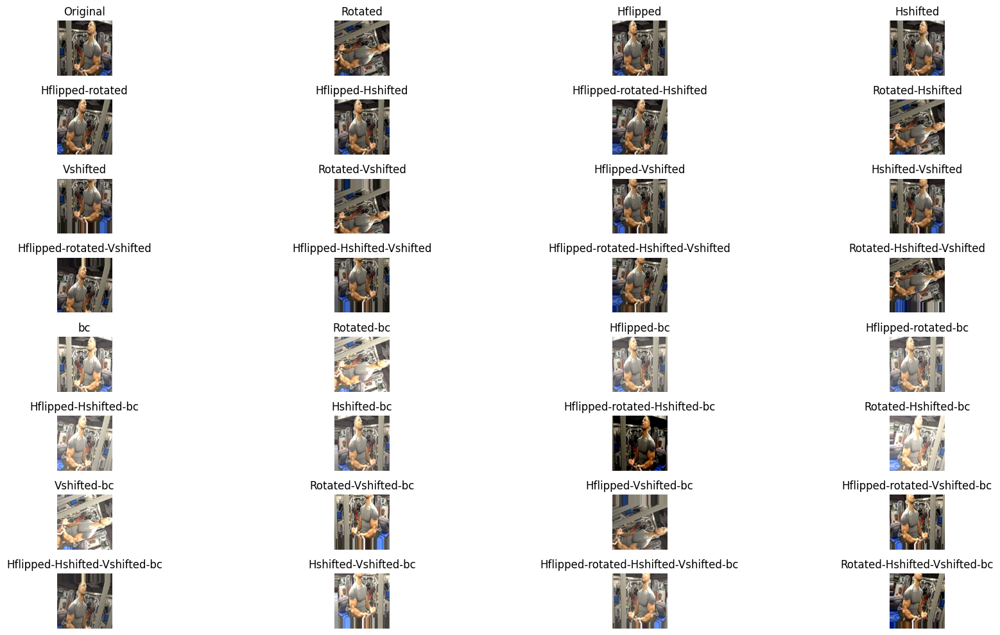

In [ ]:
compare_images('f100')

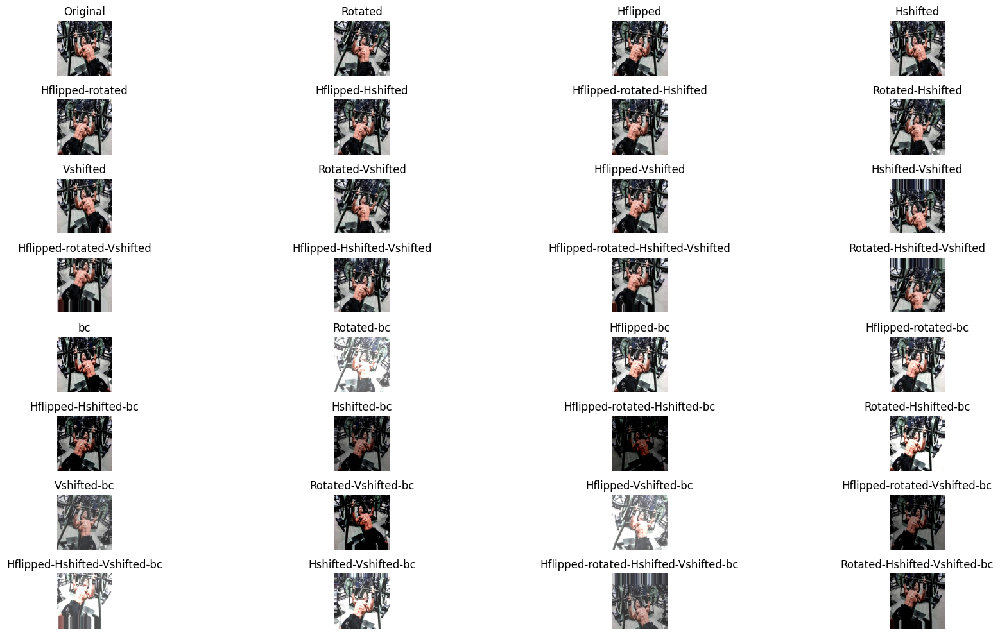

In [ ]:
compare_images('c100')

#### Shuffling the labels


In [ ]:
# import pandas as pd

# df = pd.read_csv("/content/drive/MyDrive/BEC project/labels.csv")
# df = df.sample(frac=1).reset_index(drop=True)
# df = df.loc[:, ~df.columns.str.contains('^Unnamed')]
# df.to_csv("/content/drive/MyDrive/BEC project/labels.csv", index=False)
# df.head()

,filename,label
0,c58hsvs.jpg,chestpress
1,c311hfrhs.jpg,chestpress
2,d140hfrbc.jpg,deadlift
3,f97hfhsvs.jpg,forearm
4,f90hf.jpg,forearm


### Splitting the dataset & Reorganizing it

In [ ]:
from sklearn.model_selection import train_test_split
import pandas as pd

df = pd.read_csv('/content/drive/MyDrive/BEC project/labels.csv')
train_df, test_df = train_test_split(df, test_size=0.3, random_state=42)
val_df, test_df = train_test_split(test_df, test_size=0.5, random_state=42)

len(train_df), len(val_df), len(test_df)

(14112, 3024, 3024)

In [ ]:
import os
import shutil
import pandas as pd

def move_images_by_label(df, image_dir, chestpress_dir, deadlift_dir, forearm_dir):
    """
    Moves images from image_dir to target directories based on the starting letter of the filename.

    Args:
    - df (pandas.DataFrame): DataFrame containing image filenames.
    - image_dir (str): Path to the directory containing original images.
    - chestpress_dir (str): Path to the directory to store 'chestpress' images.
    - deadlift_dir (str): Path to the directory to store 'deadlift' images.
    - forearm_dir (str): Path to the directory to store 'forearm' images.
    """

    # Ensure the target directories exist
    os.makedirs(chestpress_dir, exist_ok=True)
    os.makedirs(deadlift_dir, exist_ok=True)
    os.makedirs(forearm_dir, exist_ok=True)

    # Loop through each filename in the dataframe
    for filename in df['filename'].values:
        # Get the full path to the image in the image_dir
        image_path = os.path.join(image_dir, filename)

        if not os.path.isfile(image_path):
            print(f"File {filename} not found in {image_dir}. Skipping.")
            continue

        # Determine the target directory based on the first letter of the filename
        if filename.startswith('c'):
            target_dir = chestpress_dir
        elif filename.startswith('d'):
            target_dir = deadlift_dir
        elif filename.startswith('f'):
            target_dir = forearm_dir
        else:
            print(f"Filename {filename} does not match any category. Skipping.")
            continue

        # Construct the target path for the image
        target_path = os.path.join(target_dir, filename)

        # Move the image to the target directory
        shutil.move(image_path, target_path)

    print("Image moving process completed.")


In [ ]:
# # Moving all images back to train folder
# move_files(source_dir='/content/drive/MyDrive/BEC project/train/chestpress', destination_dir='/content/drive/MyDrive/BEC project/train')
# move_files(source_dir='/content/drive/MyDrive/BEC project/train/deadlift', destination_dir='/content/drive/MyDrive/BEC project/train')
# move_files(source_dir='/content/drive/MyDrive/BEC project/train/forearm', destination_dir='/content/drive/MyDrive/BEC project/train' )

Moved all files from /content/drive/MyDrive/BEC project/train/chestpress to /content/drive/MyDrive/BEC project/train
Moved all files from /content/drive/MyDrive/BEC project/train/deadlift to /content/drive/MyDrive/BEC project/train
Moved all files from /content/drive/MyDrive/BEC project/train/forearm to /content/drive/MyDrive/BEC project/train


In [ ]:
# # Moving the train data
# image_dir = '/content/drive/MyDrive/BEC project/train'
# chest_press_dir = '/content/drive/MyDrive/BEC project/train/chestpress'
# deadlift_dir = '/content/drive/MyDrive/BEC project/train/deadlift'
# forearm_dir = '/content/drive/MyDrive/BEC project/train/forearm'

# move_images_by_label(train_df, image_dir, chest_press_dir, deadlift_dir, forearm_dir)

Image moving process completed.


In [ ]:
len(os.listdir('/content/drive/MyDrive/BEC project/train/chestpress')) + len(os.listdir('/content/drive/MyDrive/BEC project/train/deadlift')) +len(os.listdir('/content/drive/MyDrive/BEC project/train/forearm'))

14112

In [ ]:
# # Moving the validation data
# image_dir = '/content/drive/MyDrive/BEC project/train'
# chest_press_dir = '/content/drive/MyDrive/BEC project/val/chestpress'
# deadlift_dir = '/content/drive/MyDrive/BEC project/val/deadlift'
# forearm_dir = '/content/drive/MyDrive/BEC project/val/forearm'

# move_images_by_label(val_df, image_dir, chest_press_dir, deadlift_dir, forearm_dir)

Image moving process completed.


In [ ]:
len(os.listdir('/content/drive/MyDrive/BEC project/val/chestpress')) + len(os.listdir('/content/drive/MyDrive/BEC project/val/deadlift')) +len(os.listdir('/content/drive/MyDrive/BEC project/val/forearm'))

3024

In [ ]:
# # Moving the test data
# image_dir = '/content/drive/MyDrive/BEC project/train'
# chest_press_dir = '/content/drive/MyDrive/BEC project/test/chestpress'
# deadlift_dir = '/content/drive/MyDrive/BEC project/test/deadlift'
# forearm_dir = '/content/drive/MyDrive/BEC project/test/forearm'

# move_images_by_label(test_df, image_dir, chest_press_dir, deadlift_dir, forearm_dir)

Image moving process completed.


In [ ]:
len(os.listdir('/content/drive/MyDrive/BEC project/val/chestpress')) + len(os.listdir('/content/drive/MyDrive/BEC project/val/deadlift')) +len(os.listdir('/content/drive/MyDrive/BEC project/val/forearm'))

3024

In [ ]:
len(os.listdir('/content/drive/MyDrive/BEC project/train'))

4

#### Function for creating labels dataframe (if needed)

In [ ]:
import os
import pandas as pd

def create_labels_dataframe(image_dir, target_csv_path):
    # Initialize an empty list to store rows
    rows = []

    # Loop through each file in the directory
    for filename in os.listdir(image_dir):
        if filename.lower().endswith(('.jpg')):  # Check for image files
            # Determine the label based on the filename prefix
            if filename.startswith('c'):
                label = 'chestpress'
            elif filename.startswith('d'):
                label = 'deadlift'
            elif filename.startswith('f'):
                label = 'forearm'
            else:
                continue  # Skip files that do not match any known prefix

            # Append the filename and label as a row in the list
            rows.append({'filename': filename, 'label': label})

    # Create a DataFrame from the list of rows
    df = pd.DataFrame(rows)

    # Save the DataFrame to a CSV file at the target path
    df.to_csv(target_csv_path, index=False)

    print(f"Labels DataFrame created and saved to {target_csv_path}")



In [ ]:
import os

count = 0
id = 'f102'
path = '/content/drive/MyDrive/BEC project/train'
for filename in os.listdir(path):
  full_path = path + filename
  if (id in filename):
    print(filename)
    count += 1
print(count)

f102rhsvsbc.jpg
f102hfrhsvsbc.jpg
f102hsvsbc.jpg
f102hfhsvsbc.jpg
f102hfrvsbc.jpg
f102hfvsbc.jpg
f102rvsbc.jpg
f102vsbc.jpg
f102rhsbc.jpg
f102hfrhsbc.jpg
f102hsbc.jpg
f102hfhsbc.jpg
f102hfrbc.jpg
f102hfbc.jpg
f102rbc.jpg
f102bc.jpg
f102rhsvs.jpg
f102hfrhsvs.jpg
f102hfhsvs.jpg
f102hfrvs.jpg
f102hsvs.jpg
f102hfvs.jpg
f102rvs.jpg
f102vs.jpg
f102rhs.jpg
f102hfrhs.jpg
f102hfhs.jpg
f102hfr.jpg
f102hs.jpg
f102hf.jpg
f102r.jpg
f102.jpg
32


#### Function for deleting augmented images (if needed)

In [ ]:
import os
import pandas as pd

def delete_augmented_files(source_path, csv_path):
    # Load the CSV file
    df = pd.read_csv(csv_path)

    # List of substrings to check in filenames
    substrings = ['zi']

    # Counter for deleted files
    deleted_count = 0

    # Iterate over each file in the source directory
    for filename in os.listdir(source_path):
        file_path = os.path.join(source_path, filename)

        # Check if it's a file and if the filename contains any of the specified substrings
        if os.path.isfile(file_path) and ("zi" in filename):
            # Remove the corresponding row in the dataframe
            df = df[df['filename'] != filename]

            # Delete the file
            os.remove(file_path)
            deleted_count += 1
            print(f"Deleted: {file_path}")

    # Save the updated dataframe back to the CSV file
    df.to_csv(csv_path, index=False)
    print(f"Updated labels saved to {csv_path}")

    # Print the total number of deleted files
    print(f"Total files deleted: {deleted_count}")

# Example usage:
# delete_augmented_files('/path/to/source', '/path/to/labels.csv')


In [ ]:
source_path = '/content/drive/MyDrive/BEC project/train/zoomed-in'
csv_path =  '/content/drive/MyDrive/BEC project/labels.csv'
delete_augmented_files(source_path, csv_path)

## Model training



In [ ]:
# Install the ultralytics package from PyPI
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 913.6/913.6 kB 15.0 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('yolo11n-cls.pt')  # load a pretrained model

# Train the model
results = model.train(data='/content/drive/MyDrive/BEC project/data',
                            epochs= 6,
                            imgsz=224,
                            patience=3,
                            batch=32,
                            save=True,
                            save_period=2,
                            device='cpu',
                            name='/content/drive/MyDrive/BEC project/logs-yolo11ncls',
                            optimizer='Adam',
                            seed=42,
                            plots=True)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 5.52M/5.52M [00:00<00:00, 71.6MB/s]


Ultralytics 8.3.67 🚀 Python-3.11.11 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=classify, mode=train, model=yolo11n-cls.pt, data=/content/drive/MyDrive/BEC project/data, epochs=6, time=None, patience=3, batch=32, imgsz=224, save=True, save_period=2, cache=False, device=cpu, workers=8, project=None, name=logs-yolo11ncls, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show

train: Scanning /content/drive/MyDrive/BEC project/data/train... 14112 images, 0 corrupt: 100%|██████████| 14112/14112 [40:24<00:00,  5.82it/s]


train: New cache created: /content/drive/MyDrive/BEC project/data/train.cache


val: Scanning /content/drive/MyDrive/BEC project/data/val... 3024 images, 0 corrupt: 100%|██████████| 3024/3024 [07:29<00:00,  6.73it/s]


val: New cache created: /content/drive/MyDrive/BEC project/data/val.cache
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 39 weight(decay=0.0), 40 weight(decay=0.0005), 40 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 224 train, 224 val
Using 0 dataloader workers
Logging results to /content/drive/MyDrive/BEC project/logs-yolo11ncls
Starting training for 6 epochs...

      Epoch    GPU_mem       loss  Instances       Size


        1/6         0G      1.364         32        224:   0%|          | 1/441 [00:04<30:17,  4.13s/it]


100%|██████████| 755k/755k [00:00<00:00, 13.3MB/s]
               classes   top1_acc   top5_acc: 100%|██████████| 48/48 [01:41<00:00,  2.11s/it]

                   all      0.672          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 48/48 [01:28<00:00,  1.84s/it]

                   all      0.529          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 48/48 [01:31<00:00,  1.91s/it]

                   all       0.67          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 48/48 [01:15<00:00,  1.58s/it]

                   all      0.741          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 48/48 [01:25<00:00,  1.79s/it]

                   all      0.805          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 48/48 [01:16<00:00,  1.59s/it]

                   all      0.802          1



6 epochs completed in 1.721 hours.
Optimizer stripped from /content/drive/MyDrive/BEC project/logs-yolo11ncls/weights/last.pt, 3.2MB
Optimizer stripped from /content/drive/MyDrive/BEC project/logs-yolo11ncls/weights/best.pt, 3.2MB

Validating /content/drive/MyDrive/BEC project/logs-yolo11ncls/weights/best.pt...
Ultralytics 8.3.67 🚀 Python-3.11.11 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
YOLO11n-cls summary (fused): 112 layers, 1,529,867 parameters, 0 gradients, 3.2 GFLOPs
train: /content/drive/MyDrive/BEC project/data/train... found 14112 images in 3 classes ✅ 
val: /content/drive/MyDrive/BEC project/data/val... found 3024 images in 3 classes ✅ 
test: /content/drive/MyDrive/BEC project/data/test... found 3024 images in 3 classes ✅ 


               classes   top1_acc   top5_acc: 100%|██████████| 48/48 [01:13<00:00,  1.53s/it]


                   all      0.804          1
Speed: 0.0ms preprocess, 14.7ms inference, 0.0ms loss, 0.0ms postprocess per image
Results saved to /content/drive/MyDrive/BEC project/logs-yolo11ncls


## Logging

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/BEC\ project/logs-yolo11ncls

<IPython.core.display.Javascript object>

## Prediction

In [ ]:
# Function for viewing the prediction, true label and image for a sample
import os
import matplotlib.pyplot as plt
import cv2


def plot_pred(model,folder_path, image_name):
  # Make the full path to image
  image_path = os.path.join(folder_path, image_name)

  # Get the confidence of prediction
  results = model.predict(image_path, imgsz=224, conf=0.5)
  t = results[0].probs.data
  lst = []
  for n in t:
    lst.append(float(n))

  pred_prob = max(lst)

  # Get the true label
  if image_name.startswith('c'):
    true_label= 'chestpress'
  elif image_name.startswith('d'):
    true_label= 'deadlift'
  else:
    true_label= "forearm"

  # Get the image
  image = cv2.imread(image_path)
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  # Get the predicted label
  cls = results[0].probs.top1
  if cls == 0:
    pred_label = 'chestpress'
  elif cls == 1:
    pred_label = 'deadlift'
  else:
    pred_label = 'forearm'


  # Plot image
  plt.imshow(image)
  plt.axis('off')

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title('{} {:2.0f}% {}'.format(pred_label,
                                    pred_prob*100,
                                    true_label),
            color = color)



### Prediction 1


image 1/1 /content/drive/MyDrive/BEC project/data/test/forearm/f100hfhs.jpg: 224x224 forearm 0.97, chestpress 0.03, deadlift 0.01, 22.3ms
Speed: 3.9ms preprocess, 22.3ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)


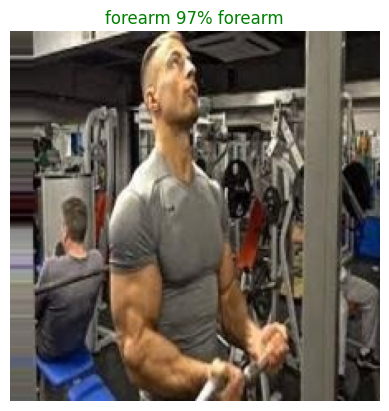

In [ ]:
model = YOLO('/content/drive/MyDrive/BEC project/logs-yolo11ncls/weights/best.pt')
folder_path = '/content/drive/MyDrive/BEC project/data/test/forearm'
image_name = 'f100hfhs.jpg'

plot_pred(model, folder_path, image_name)

### Prediction 2


image 1/1 /content/drive/MyDrive/BEC project/data/test/deadlift/d102hfrbc.jpg: 224x224 chestpress 0.67, deadlift 0.27, forearm 0.06, 83.2ms
Speed: 9.6ms preprocess, 83.2ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)


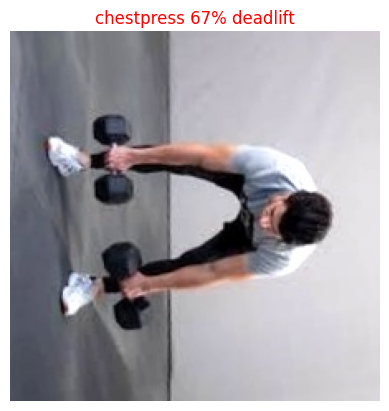

In [ ]:
model = YOLO('/content/drive/MyDrive/BEC project/logs-yolo11ncls/weights/best.pt')
folder_path = '/content/drive/MyDrive/BEC project/data/test/deadlift'
image_name = 'd102hfrbc.jpg'

plot_pred(model, folder_path, image_name)

### Prediction 3


image 1/1 /content/drive/MyDrive/BEC project/data/test/chestpress/c100hfrbc.jpg: 224x224 chestpress 1.00, forearm 0.00, deadlift 0.00, 38.5ms
Speed: 3.4ms preprocess, 38.5ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)


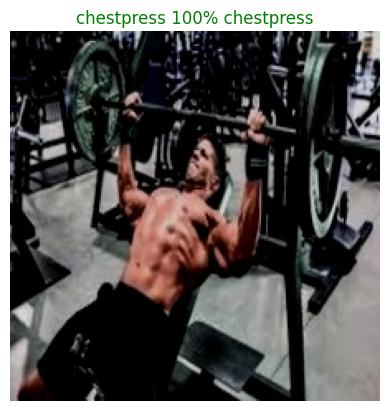

In [ ]:
model = YOLO('/content/drive/MyDrive/BEC project/logs-yolo11ncls/weights/best.pt')
folder_path = '/content/drive/MyDrive/BEC project/data/test/chestpress'
image_name = 'c100hfrbc.jpg'

plot_pred(model, folder_path, image_name)

## Visualizing the prediction probabilities

In [ ]:
# Function to plot the 3 prediction probability values and labels
import numpy as np


def plot_pred_conf(model, folder_path, image_name):

  # Make the full path to image
  image_path = os.path.join(folder_path, image_name)

  # Get the confidence of prediction
  results = model.predict(image_path, imgsz=224, conf=0.5)
  t = results[0].probs.data
  lst = []
  for n in t:
    lst.append(float(n))

  pred_prob = max(lst)

  # Get the true label
  if image_name.startswith('c'):
    true_label= 'chestpress'
  elif image_name.startswith('d'):
    true_label= 'deadlift'
  else:
    true_label= "forearm"

  # Get the predicted label
  cls = results[0].probs.top1
  if cls == 0:
    pred_label = 'chestpress'
  elif cls == 1:
    pred_label = 'deadlift'
  else:
    pred_label = 'forearm'

  # Find the 3 prediction confidence indexes
  top_3_pred_indexes = np.array(results[0].probs.top5).argsort()

  # Find the 3 prediction confidence values❓🟥
  top_3_pred_values = []
  for i in top_3_pred_indexes:
    top_3_pred_values.append(results[0].probs.top5conf[i])

  # Find the 3 prediction labels
  top_3_pred_labels = []
  for i in range(len(top_3_pred_indexes)):
    if i == 0:
      top_3_pred_labels.append('chestpress')
    elif i == 1:
      top_3_pred_labels.append('deadlift')
    else:
      top_3_pred_labels.append('forearm')


  # Plot
  tplot = plt.bar(np.arange(len(top_3_pred_labels)),
                 top_3_pred_values,
                 color='grey')
  plt.xticks(np.arange(len(top_3_pred_labels)),
             labels = top_3_pred_labels)


  print('True label:', true_label)
  print('Pred_label:', pred_label)


### Prediction 1


image 1/1 /content/drive/MyDrive/BEC project/data/test/forearm/f100hfhs.jpg: 224x224 forearm 0.97, chestpress 0.03, deadlift 0.01, 20.5ms
Speed: 2.9ms preprocess, 20.5ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
True label: forearm
Pred_label: forearm


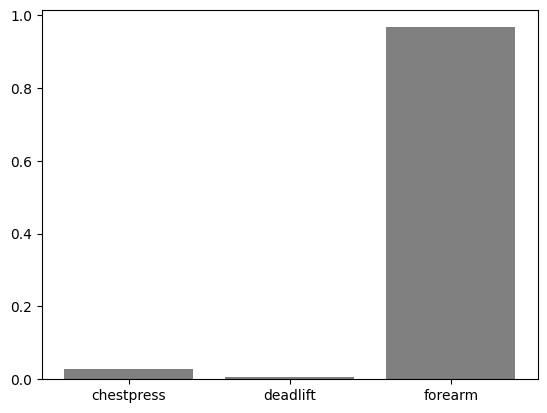

In [ ]:
model = YOLO('/content/drive/MyDrive/BEC project/logs-yolo11ncls/weights/best.pt')
folder_path = '/content/drive/MyDrive/BEC project/data/test/forearm'
image_name = 'f100hfhs.jpg'

plot_pred_conf(model,folder_path, image_name)

### Prediction 2


image 1/1 /content/drive/MyDrive/BEC project/data/test/deadlift/d102hfrbc.jpg: 224x224 chestpress 0.67, deadlift 0.27, forearm 0.06, 22.4ms
Speed: 2.5ms preprocess, 22.4ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
True label: deadlift
Pred_label: chestpress


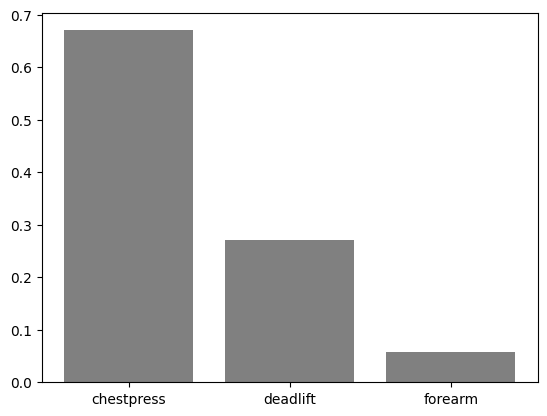

In [ ]:
model = YOLO('/content/drive/MyDrive/BEC project/logs-yolo11ncls/weights/best.pt')
folder_path = '/content/drive/MyDrive/BEC project/data/test/deadlift'
image_name = 'd102hfrbc.jpg'

plot_pred_conf(model, folder_path, image_name)

### Prediction 3


image 1/1 /content/drive/MyDrive/BEC project/data/test/chestpress/c100hfrbc.jpg: 224x224 chestpress 1.00, forearm 0.00, deadlift 0.00, 21.1ms
Speed: 3.7ms preprocess, 21.1ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
True label: chestpress
Pred_label: chestpress


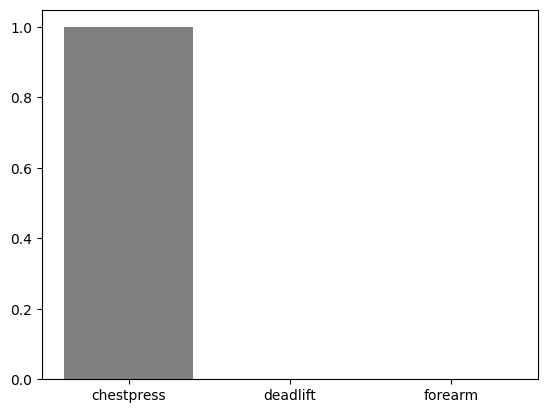

In [ ]:
model = YOLO('/content/drive/MyDrive/BEC project/logs-yolo11ncls/weights/best.pt')
folder_path = '/content/drive/MyDrive/BEC project/data/test/chestpress'
image_name = 'c100hfrbc.jpg'

plot_pred_conf(model, folder_path, image_name)

## Evaluating the model

### On validation set

In [ ]:
model = YOLO('/content/drive/MyDrive/BEC project/logs-yolo11ncls/weights/best.pt')
datapath= '/content/drive/MyDrive/BEC project/data'
validation_results = model.val(data= datapath,
                               imgsz=224,
                               batch=32,
                               plots=True,
                               name='/content/drive/MyDrive/BEC project/validation-yolo11ncls')

Ultralytics 8.3.67 🚀 Python-3.11.11 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
YOLO11n-cls summary (fused): 112 layers, 1,529,867 parameters, 0 gradients, 3.2 GFLOPs
train: /content/drive/MyDrive/BEC project/data/train... found 14112 images in 3 classes ✅ 
val: /content/drive/MyDrive/BEC project/data/val... found 3024 images in 3 classes ✅ 
test: /content/drive/MyDrive/BEC project/data/test... found 3024 images in 3 classes ✅ 


val: Scanning /content/drive/MyDrive/BEC project/data/val... 3024 images, 0 corrupt: 100%|██████████| 3024/3024 [00:00<?, ?it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 95/95 [01:11<00:00,  1.33it/s]


                   all      0.804          1
Speed: 0.0ms preprocess, 14.0ms inference, 0.0ms loss, 0.0ms postprocess per image
Results saved to /content/drive/MyDrive/BEC project/validation-yolo11ncls


#### Metrics:
* Precision
* Recall
* f1_score
* Overall accuracy
* Macro-averaged precision, recall, f1-score
* Weighted-average precision, recall, f1-score

In [ ]:
import numpy as np

# Confusion matrix (rows: predicted, columns: true labels)
confusion_matrix = np.array([[1503, 150, 195], # Predicted chestpress
                             [44, 527, 97],    # Predicted deadlift
                             [77, 30, 401]])   # Predicted forearm

# Initialize metrics
num_classes = confusion_matrix.shape[0]
precision = []
recall = []
f1_score = []
accuracy = 0
support = []

# Calculate metrics for each class
for i in range(num_classes):
  TP = confusion_matrix[i,i]
  FP = confusion_matrix[i, :].sum() - TP
  FN = confusion_matrix[:, i].sum() -TP
  support_i = confusion_matrix[:, i].sum()  # Total true samples for class i

  precision_i = TP/ (TP + FP) if (TP + FN > 0) else 0
  recall_i = TP/ (TP + FN) if (TP + FN > 0) else 0
  f1_i = 2*(precision_i * recall_i)/(precision_i + recall_i) if (precision_i + recall_i > 0) else 0

  precision.append(precision_i)
  recall.append(recall_i)
  f1_score.append(f1_i)
  accuracy += confusion_matrix[i,i]
  support.append(support_i)

# Calulating overall accuracy
accuracy = accuracy/confusion_matrix.sum()

# Calculating Macro-averaged precision, recall, f1_score
m_precision = sum(precision)/3
m_recall = sum(recall)/3
m_f1 = sum(f1_score)/3

# Calculatin weighted-average precision, recall, f1_score
total_support = sum(support)
weighted_precision = sum(p * s for p, s in zip(precision, support)) / total_support
weighted_recall = sum(r * s for r, s in zip(recall, support)) / total_support
weighted_f1 = sum(f * s for f, s in zip(f1_score, support)) / total_support



# Display results
print(f"Metrics for each class:")
for i, class_name in enumerate(['chestpress', 'deadlift', 'forearm']):
  print(f"{class_name}: Precision = {precision[i]:.2f}, Recall = {recall[i]:.2f}, F1_score = {f1_score[i]:.2f}")

# Overall accuracy
print(f"\nAccuracy = {accuracy}")

# Print macro-averages
print("\nMacro Averages:")
print(f"Macro Precision = {m_precision}")
print(f"Macro recall = {m_recall}")
print(f"Macro f1-score = {m_f1}")

# Print weighted averages
print("\nWeighted Averages:")
print(f"Weighted Precision = {weighted_precision}")
print(f"Weighted Recall = {weighted_recall}")
print(f"Weighted F1-score = {weighted_f1}")

Metrics for each class:
chestpress: Precision = 0.81, Recall = 0.93, F1_score = 0.87
deadlift: Precision = 0.79, Recall = 0.75, F1_score = 0.77
forearm: Precision = 0.79, Recall = 0.58, F1_score = 0.67

Accuracy = 0.8039021164021164

Macro Averages:
Macro Precision = 0.7972013075801562
Macro recall = 0.7498464337402542
Macro f1-score = 0.7667019057688392

Weighted Averages:
Weighted Precision = 0.8021228870558754
Weighted Recall = 0.8039021164021164
Weighted F1-score = 0.7972054409046834


### On test set

In [ ]:
from ultralytics import YOLO

model = YOLO('/content/drive/MyDrive/BEC project/logs-yolo11ncls/weights/best.pt')
datapath= '/content/drive/MyDrive/BEC project/data'
test_results = model.val(data= datapath,
                               imgsz=224,
                               batch=32,
                               plots=True,
                               split='test',
                               name='/content/drive/MyDrive/BEC project/test-yolo11ncls')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.68 🚀 Python-3.11.11 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
YOLO11n-cls summary (fused): 112 layers, 1,529,867 parameters, 0 gradients, 3.2 GFLOPs
train: /content/drive/MyDrive/BEC project/data/train... found 14112 images in 3 classes ✅ 
val: /content/drive/MyDrive/BEC project/data/val... found 3024 images in 3 classes ✅ 
test: /content/drive/MyDrive/BEC project/data/test... found 3024 images in 3 classes ✅ 


test: Scanning /content/drive/MyDrive/BEC project/data/test... 3024 images, 0 corrupt: 100%|██████████| 3024/3024 [10:09<00:00,  4.96it/s]


test: New cache created: /content/drive/MyDrive/BEC project/data/test.cache


               classes   top1_acc   top5_acc:   1%|          | 1/95 [00:01<01:50,  1.18s/it]


100%|██████████| 755k/755k [00:00<00:00, 12.5MB/s]
               classes   top1_acc   top5_acc: 100%|██████████| 95/95 [01:22<00:00,  1.15it/s]


                   all       0.79          1
Speed: 0.0ms preprocess, 17.5ms inference, 0.0ms loss, 0.0ms postprocess per image
Results saved to /content/drive/MyDrive/BEC project/test-yolo11ncls


#### Metrics:
* Precision
* Recall
* f1_score
* Overall accuracy
* Macro-averaged precision, recall, f1-score
* Weighted-average precision, recall, f1-score

In [ ]:
import numpy as np

# Confusion matrix (rows: predicted, columns: true labels)
confusion_matrix = np.array([[1460, 159, 206], # Predicted chestpress
                             [45, 511, 109],    # Predicted deadlift
                             [89, 26, 419]])   # Predicted forearm

# Initialize metrics
num_classes = confusion_matrix.shape[0]
precision = []
recall = []
f1_score = []
accuracy = 0
support = []

# Calculate metrics for each class
for i in range(num_classes):
  TP = confusion_matrix[i,i]
  FP = confusion_matrix[i, :].sum() - TP
  FN = confusion_matrix[:, i].sum() -TP
  support_i = confusion_matrix[:, i].sum()  # Total true samples for class i

  precision_i = TP/ (TP + FP) if (TP + FN > 0) else 0
  recall_i = TP/ (TP + FN) if (TP + FN > 0) else 0
  f1_i = 2*(precision_i * recall_i)/(precision_i + recall_i) if (precision_i + recall_i > 0) else 0

  precision.append(precision_i)
  recall.append(recall_i)
  f1_score.append(f1_i)
  accuracy += confusion_matrix[i,i]
  support.append(support_i)

# Calulating overall accuracy
accuracy = accuracy/confusion_matrix.sum()

# Calculating Macro-averaged precision, recall, f1_score
m_precision = sum(precision)/3
m_recall = sum(recall)/3
m_f1 = sum(f1_score)/3

# Calculatin weighted-average precision, recall, f1_score
total_support = sum(support)
weighted_precision = sum(p * s for p, s in zip(precision, support)) / total_support
weighted_recall = sum(r * s for r, s in zip(recall, support)) / total_support
weighted_f1 = sum(f * s for f, s in zip(f1_score, support)) / total_support



# Display results
print(f"Metrics for each class:")
for i, class_name in enumerate(['chestpress', 'deadlift', 'forearm']):
  print(f"{class_name}: Precision = {precision[i]:.2f}, Recall = {recall[i]:.2f}, F1_score = {f1_score[i]:.2f}")

# Overall accuracy
print(f"\nAccuracy = {accuracy}")

# Print macro-averages
print("\nMacro Averages:")
print(f"Macro Precision = {m_precision}")
print(f"Macro recall = {m_recall}")
print(f"Macro f1-score = {m_f1}")

# Print weighted averages
print("\nWeighted Averages:")
print(f"Weighted Precision = {weighted_precision}")
print(f"Weighted Recall = {weighted_recall}")
print(f"Weighted F1-score = {weighted_f1}")

Metrics for each class:
chestpress: Precision = 0.80, Recall = 0.92, F1_score = 0.85
deadlift: Precision = 0.77, Recall = 0.73, F1_score = 0.75
forearm: Precision = 0.78, Recall = 0.57, F1_score = 0.66

Accuracy = 0.7903439153439153

Macro Averages:
Macro Precision = 0.784355082462711
Macro recall = 0.7403249480932829
Macro f1-score = 0.7552842050508753

Weighted Averages:
Weighted Precision = 0.7890045937774107
Weighted Recall = 0.7903439153439153
Weighted F1-score = 0.783427475495101


## Helpfull functions

In [ ]:
# Function for deleting a folder's contents

import os
import shutil

def delete_folder_contents(folder_path):
    """
    Deletes all contents of a given folder (files and subfolders).

    Args:
        folder_path (str): Path to the folder whose contents are to be deleted.

    Raises:
        FileNotFoundError: If the specified folder does not exist.
        PermissionError: If the program lacks the permissions to delete some files or folders.
    """
    if not os.path.exists(folder_path):
        raise FileNotFoundError(f"The folder at path '{folder_path}' does not exist.")

    for item in os.listdir(folder_path):
        item_path = os.path.join(folder_path, item)
        try:
            if os.path.isfile(item_path) or os.path.islink(item_path):
                os.unlink(item_path)  # Remove file or symbolic link
            elif os.path.isdir(item_path):
                shutil.rmtree(item_path)  # Remove directory and its contents
        except Exception as e:
            raise PermissionError(f"Failed to delete '{item_path}': {e}")

In [ ]:
folder_path = '/content/runs'
delete_folder_contents(folder_path)

In [ ]:
# Function for moving a folder
import shutil
import os

def move_folder(source_path, destination_path):
    """
    Moves a folder from source path to destination path.

    Args:
    - source_path (str): The path to the folder to be moved.
    - destination_path (str): The path to where the folder will be moved.

    Returns:
    - None
    """
    # Check if the source folder exists
    if not os.path.exists(source_path):
        print(f"The source folder {source_path} does not exist.")
        return

    # Ensure the destination directory exists, or create it
    os.makedirs(destination_path, exist_ok=True)

    # Move the folder
    try:
        shutil.move(source_path, destination_path)
        print(f"Folder {source_path} successfully moved to {destination_path}.")
    except Exception as e:
        print(f"Error while moving the folder: {e}")